In [5]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))


<h1>Import necessary libraries for the project</h1>

In [6]:

import matplotlib.pyplot as plt # for plotting images
import tensorflow as tf # for building deep learning models
import seaborn as sns # for visualizing data
import random # for generating random numbers
from PIL import Image # for opening and manipulating images
from tensorflow.keras.preprocessing import image # for preprocessing images
from tensorflow.keras.applications.inception_v3 import InceptionV3 # for using pre-trained InceptionV3 model
from tensorflow.keras import Sequential, Model # for building sequential and functional models
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten,
Dropout, Input,GlobalAveragePooling2D,BatchNormalization) # for adding different layers to the models
from tensorflow.keras.activations import softmax # for applying softmax activation function to the output layer
from tensorflow.keras.optimizers import Adam # for using Adam optimizer
from keras.preprocessing.image import ImageDataGenerator # for data augmentation and preprocessing
from mpl_toolkits.axes_grid1 import ImageGrid # for plotting images in a grid
from keras.models import Model # for building functional models
from keras.applications.vgg16 import VGG16, preprocess_input # for using pre-trained VGG16 model and preprocessing input data
from keras.callbacks import ModelCheckpoint, EarlyStopping # for saving model weights and early stopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix,
accuracy_score) # for computing and displaying confusion matrix and accuracy score
import cv2 # for image processing and computer vision tasks

In [7]:
import warnings # supress warnings
warnings.filterwarnings('ignore')

In [8]:
# Create a list of folder names to be used later for loading images

our_folders = ['Acne and Rosacea Photos', \
              'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', \
              'Melanoma Skin Cancer Nevi and Moles', \
              'Vasculitis Photos', \
              'Hair Loss Photos Alopecia and other Hair Diseases'
              ]

In [9]:
root_dir =  r'C:\Users\samro\OneDrive\Bureau\archive\train'

In [10]:
test_dir = r'C:\Users\samro\OneDrive\Bureau\archive\test'

In [11]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
actinic_train_path = os.path.join(root_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_train_path = os.path.join(root_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_train_path = os.path.join(root_dir, 'Vasculitis Photos')
Hair_train_path = os.path.join(root_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')

In [12]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
actinic_test_path = os.path.join(test_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_test_path = os.path.join(test_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_test_path = os.path.join(test_dir, 'Vasculitis Photos')
Hair_test_path = os.path.join(test_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')



actinic_test_files = ([files_ for _, _, files_ in os.walk(actinic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
melonama_test_files = ([files_ for _, _, files_ in os.walk(melonama_test_path)])[0]
vasculitis_test_files = ([files_ for _, _, files_ in os.walk(vasculitis_test_path)])[0]
Hair_test_files = ([files_ for _, _, files_ in os.walk(Hair_test_path)])[0]

In [13]:
train_dirs = [] # create an empty list to store the directory paths of training images

# loop over the list of folder names
for i in our_folders:
    
    # loop over the directories and their subdirectories in the folder
    for folder_,_, files_ in os.walk(f'input/train/{i}'):
        
        print(folder_) # print the directory path
        train_dirs.append(folder_) # add the directory path to the list

In [14]:
#Get all image files in each train directory
actinic_train_files = ([files_ for _, _, files_ in os.walk(actinic_train_path)])[0]
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]
melonama_train_files = ([files_ for _, _, files_ in os.walk(melonama_train_path)])[0]
vasculitis_train_files = ([files_ for _, _, files_ in os.walk(vasculitis_train_path)])[0]
Hair_train_files = ([files_ for _, _, files_ in os.walk(Hair_train_path)])[0]

In [15]:
# Define a function for plotting a grid of images for a given folder and its files
def plotGridImages(d_name, list_files, train_path, nrows=1, ncols=5):
    # Create a figure with subplots arranged in a grid
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    # Print the name of the folder for which the images are being displayed
    print(f"{d_name}")
    # Loop over a random sample of files from the folder
    for i, img_id in enumerate(random.sample(list_files, ncols)):
        # Get the image and its path
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        # Show the image in the subplot
        ax.imshow(img / 255.)
        # Add text to the subplot indicating the label of the image
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w', alpha=0.8)
        ax.axis('off')
    # Display the grid of images
    plt.show()

Actinic


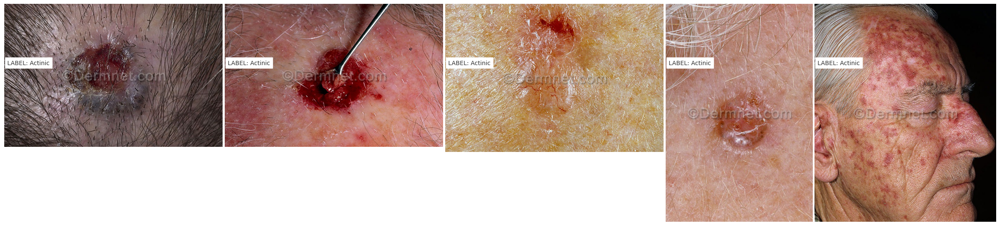

In [16]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=5)

Acne


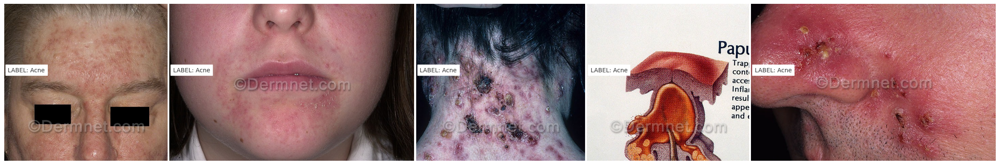

In [17]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=5)

Melonama


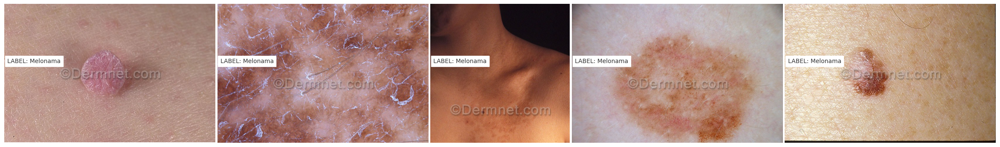

In [18]:
plotGridImages('Melonama',melonama_train_files, melonama_train_path,ncols=5)

Vasculitis


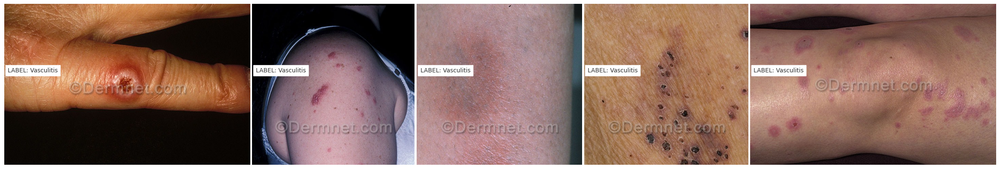

In [19]:
plotGridImages('Vasculitis',vasculitis_train_files, vasculitis_train_path,ncols=5)

Hair


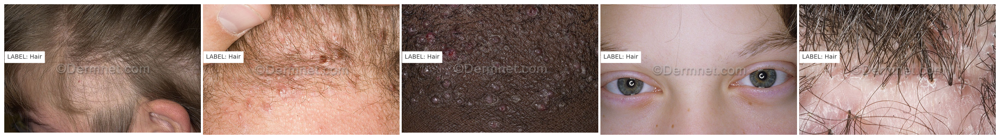

In [20]:
plotGridImages('Hair',Hair_train_files, Hair_train_path,ncols=5)

# DataFrame Creation 

In [21]:
final_df = pd.DataFrame()

In [22]:
actinic_df = pd.DataFrame()
actinic_df['Image'] =  [actinic_train_path+'/'+img for img in actinic_train_files]
actinic_df['Label'] = "actinic"

In [23]:
actinic_df.shape

(1149, 2)

In [24]:
melonama_df = pd.DataFrame()
melonama_df['Image'] = [melonama_train_path+'/'+img for img in melonama_train_files]
melonama_df['Label'] = "melonama"

In [25]:
melonama_df.shape

(463, 2)

In [26]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [27]:
acne_df.shape

(840, 2)

In [28]:
vasculitis_df = pd.DataFrame()
vasculitis_df['Image'] =  [vasculitis_train_path+'/'+img for img in vasculitis_train_files]
vasculitis_df['Label'] = "vasculitis"

In [29]:
vasculitis_df.shape

(416, 2)

In [30]:
HairLoss_df = pd.DataFrame()
HairLoss_df['Image'] =  [Hair_train_path+'/'+img for img in Hair_train_files]
HairLoss_df['Label'] = "HairLoss"

In [31]:
HairLoss_df.shape

(239, 2)

In [32]:
final_df = pd.concat([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [33]:
final_df = pd.DataFrame(final_df)


In [34]:

#final_df = final_df.append([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [35]:
final_df.shape

(3107, 2)

In [36]:
final_df.head(3)

,Image,Label
0,C:\Users\samro\OneDrive\Bureau\archive\train\A...,actinic
1,C:\Users\samro\OneDrive\Bureau\archive\train\A...,actinic
2,C:\Users\samro\OneDrive\Bureau\archive\train\A...,actinic


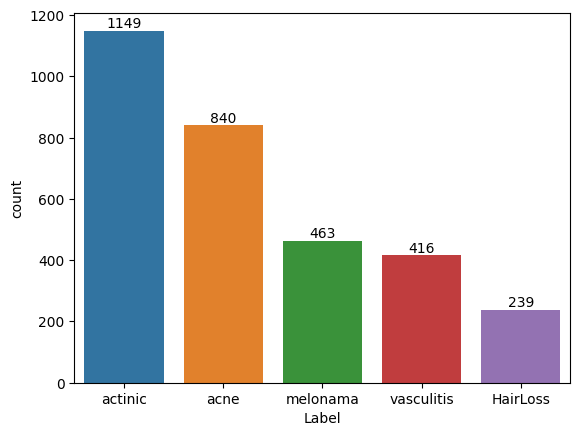

In [37]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [38]:
final_test_df = pd.DataFrame()
################# melonama #########

melonama_test_df = pd.DataFrame()
melonama_test_df['Image'] = [melonama_test_path+'/'+img for img in melonama_test_files]
melonama_test_df['Label'] = "melonama"

##################  actinic  ##########

actinic_test_df = pd.DataFrame()
actinic_test_df['Image'] =  [actinic_test_path+'/'+img for img in actinic_test_files]
actinic_test_df['Label'] = "actinic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"

###########################################

vasculitis_test_df = pd.DataFrame()
vasculitis_test_df['Image'] =  [vasculitis_test_path+'/'+img for img in vasculitis_test_files]
vasculitis_test_df['Label'] = "vasculitis"

###########################################

HairLoss_test_df = pd.DataFrame()
HairLoss_test_df['Image'] =  [Hair_test_path+'/'+img for img in Hair_test_files]
HairLoss_test_df['Label'] = "HairLoss"

###########################################
print(type(final_test_df))

final_test_df = pd.concat([final_test_df, actinic_test_df, melonama_test_df, acne_test_df, vasculitis_test_df, HairLoss_test_df], ignore_index=True)


final_test_df.shape

<class 'pandas.core.frame.DataFrame'>


(881, 2)

In [39]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [40]:
# Define the batch size
batch_size = 32

# Create a training data generator
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the training data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='training',         # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a validation data generator
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the validation data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='validation',       # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a test data generator
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,   # The DataFrame containing the test data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=1,              # The batch size
    class_mode='categorical',  # The type of classification (categorical or sparse)
    shuffle=False,             # Whether to shuffle the data
)

Found 2486 validated image filenames belonging to 5 classes.
Found 621 validated image filenames belonging to 5 classes.
Found 881 validated image filenames belonging to 5 classes.


In [41]:
# Importing Xception model from Keras applications
from tensorflow.keras.applications import Xception

# Load the Xception model trained on ImageNet dataset and exclude the last (top) layers
res = Xception(weights ='imagenet', include_top = False, input_shape = (224, 224, 3)) 

# Set the trainable parameter to False to freeze the weights of the loaded layers
res.trainable = False

# Creating new layers on top of the loaded model
x = res.output  # Output from the loaded Xception model is used as input to the new layers
x = GlobalAveragePooling2D()(x)  # Global Average Pooling layer reduces the dimensions of the input
x = BatchNormalization()(x)  # Batch Normalization layer normalizes the inputs to speed up training
x = Dropout(0.5)(x)  # Dropout layer randomly drops a fraction of the input units to prevent overfitting
x = Dense(512, activation ='relu')(x)  # Fully connected Dense layer with 512 output units and ReLU activation
x = BatchNormalization()(x)
x = Dropout(0.5)(x) 
x = Dense(256, activation ='relu')(x)  # Fully connected Dense layer with 256 output units and ReLU activation
x = BatchNormalization()(x)
x = Dense(5, activation ='softmax')(x)  # Final fully connected Dense layer with 5 output units and Softmax activation for classification

# Creating a Keras model by specifying the input and output layers
model = Model(res.input, x)

# Compiling the model by specifying the optimizer, loss function and evaluation metric
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
              loss ="categorical_crossentropy",
              metrics =["categorical_accuracy"])

# Printing the summary of the model, showing the layers and their shapes
model.summary()

83697664/83683744 [==============================] - 104s 1us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
___________________________

In [42]:
custom_early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10, 
    min_delta=0.001, 
    mode='min'
)

In [43]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

In [44]:
class CustomEarlyStopping(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs['val_loss'] > 0.5:
            print("Stopping training because validation loss is too high")
            self.model.stop_training = True

In [45]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True)

history = model.fit(train_generator, 
                    epochs=500, 
                    validation_data=valid_generator,
                    #callbacks=[early_stopping]
                   )

Epoch 1/500
78/78 [==============================] - 48s 473ms/step - loss: 1.4588 - categorical_accuracy: 0.4871 - val_loss: 1.3433 - val_categorical_accuracy: 0.3301
Epoch 2/500
78/78 [==============================] - 31s 392ms/step - loss: 1.1348 - categorical_accuracy: 0.5969 - val_loss: 1.5363 - val_categorical_accuracy: 0.2383
Epoch 3/500
78/78 [==============================] - 29s 375ms/step - loss: 1.0815 - categorical_accuracy: 0.6106 - val_loss: 1.5444 - val_categorical_accuracy: 0.2818
Epoch 4/500
78/78 [==============================] - 32s 408ms/step - loss: 1.0488 - categorical_accuracy: 0.6163 - val_loss: 1.2673 - val_categorical_accuracy: 0.4670
Epoch 5/500
78/78 [==============================] - 29s 375ms/step - loss: 0.9712 - categorical_accuracy: 0.6500 - val_loss: 1.1219 - val_categorical_accuracy: 0.5314
Epoch 6/500
78/78 [==============================] - 28s 360ms/step - loss: 0.9516 - categorical_accuracy: 0.6452 - val_loss: 1.2512 - val_categorical_accuracy:

# Model Visualization

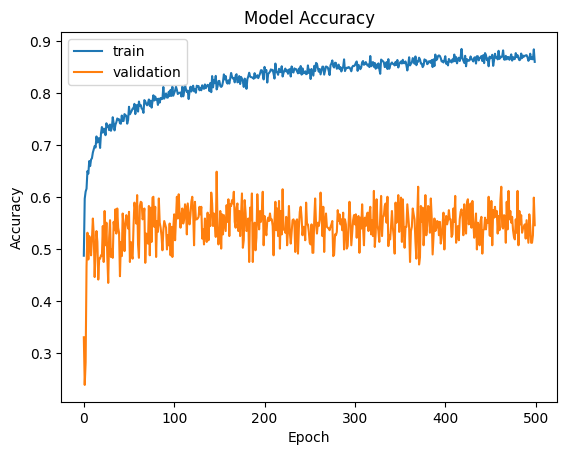

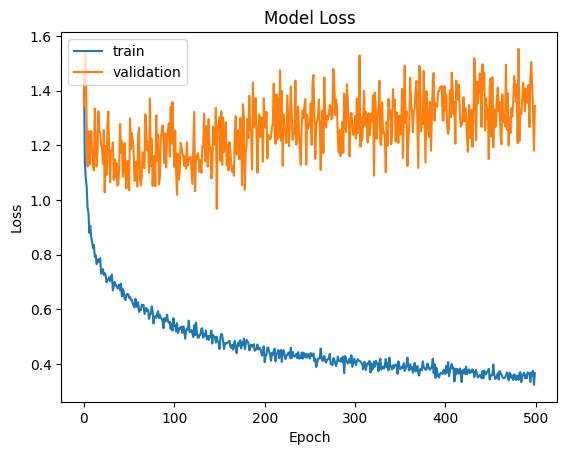

In [46]:
import matplotlib.pyplot as plt

# plot the training and validation accuracy curves
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# plot the training and validation loss curves
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

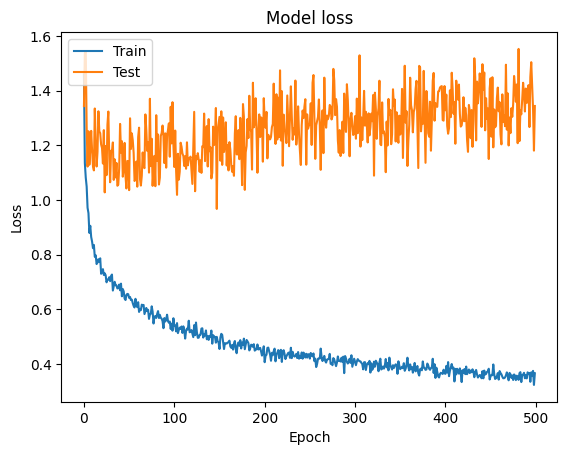

In [47]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

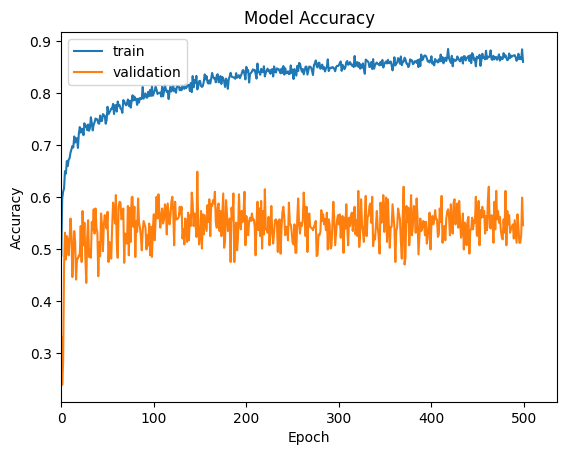

In [48]:
import matplotlib.pyplot as plt

plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.xlim([0, 536])  # Set the x-axis limits to show up to 500 epochs
plt.show()


ConfusionMatrixDisplay

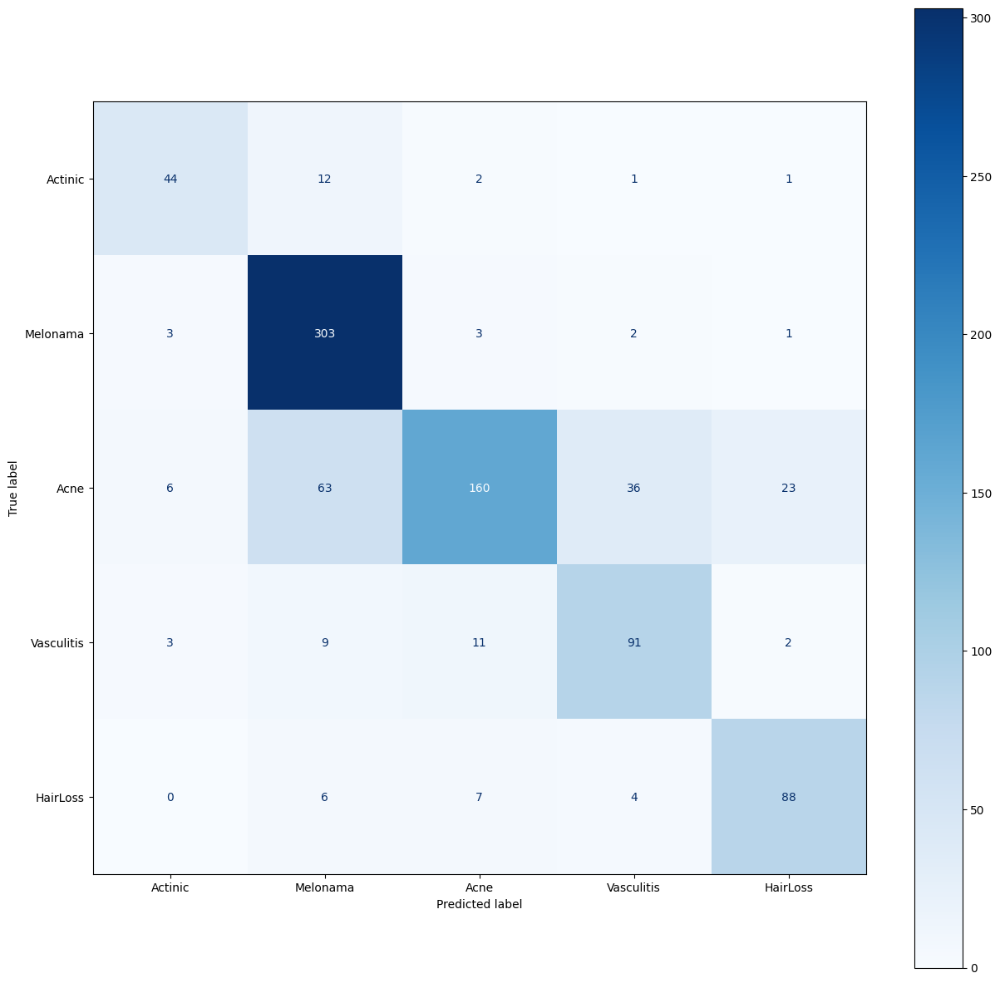

In [49]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

Model Accuracy

In [50]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

881/881 [==============================] - 9s 10ms/step - loss: 0.7436 - categorical_accuracy: 0.7787
test_loss, test accuracy [0.7436084151268005, 0.7786605954170227]


In [51]:
xp_preds = model.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)

In [52]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Xception Model Accuracy: {:.2f}%".format(xp_acc * 100))

Xception Model Accuracy: 77.87%


# Model Save

In [53]:
from tensorflow.keras.models import load_model

In [54]:
model.save(os.path.join('models','New.h5'))

In [55]:
ImageModel = load_model('models/New.h5')

In [56]:
historyy = ImageModel.history


In [57]:
Normal = ["hairloss", "acne and rosacea"]
Dangerous = ["actinic keratosis basal cell carcinoma", "vasculties", "melanoma skin cancer nevi and moles"]

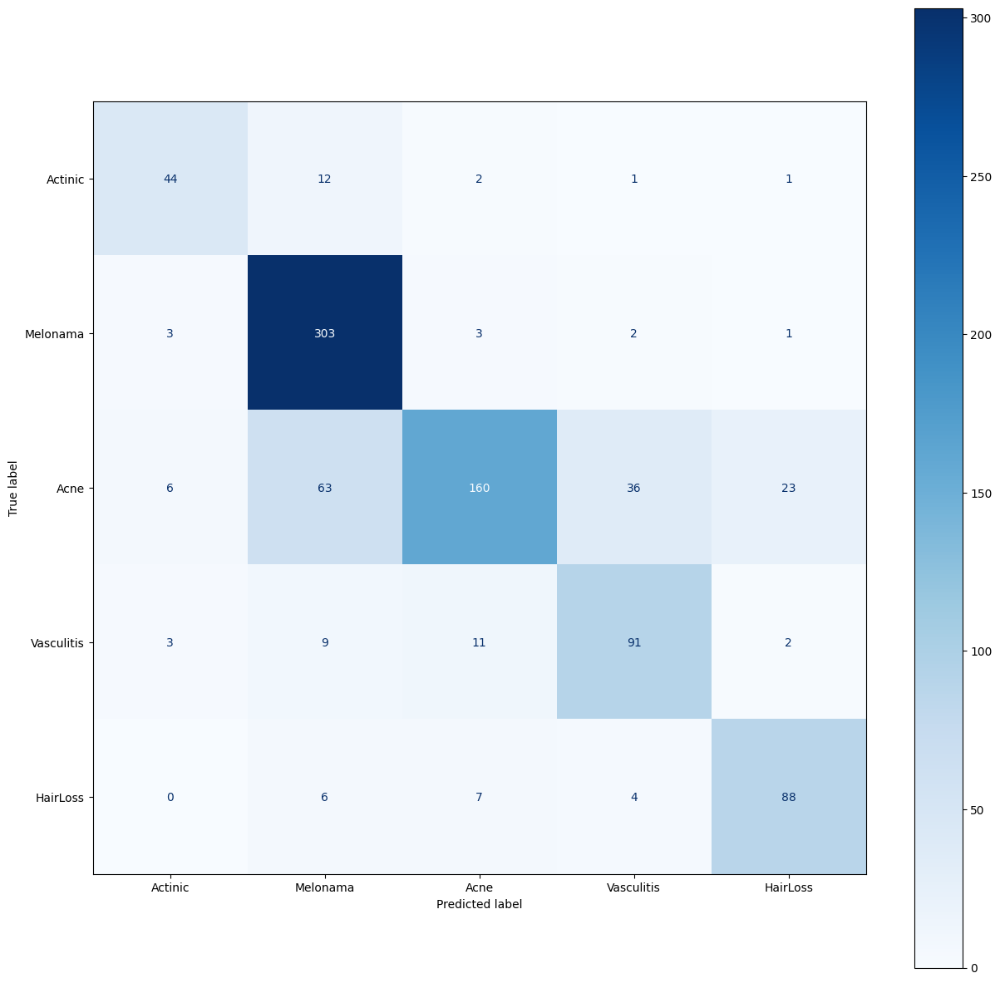

In [58]:
test_true=test_generator.classes
test_pred_raw = ImageModel.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

# Model Test

Test ImageModel

In [59]:
xp_preds = ImageModel.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Xception Model Accuracy: {:.2f}%".format(xp_acc * 100))

Xception Model Accuracy: 77.87%


Class Prediction Array

In [60]:
img = tf.keras.utils.load_img(
    'C:/Users/samro/OneDrive/Bureau/archive/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg',
    target_size=(224, 224)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = ImageModel.predict(img_array/224) #To split

predictions  #Prediction % for eacr diseas

array([[9.9627006e-01, 1.1562022e-03, 1.1058029e-03, 1.4519170e-03,
        1.5980440e-05]], dtype=float32)

Disease Prediction

In [61]:
score = tf.nn.softmax(predictions[0])

#class_names = list(train_generator.class_indices)
# train_generator.class_indices = {'HairLoss': 0, 'acne': 1, 'actinic': 2, 'melonama': 3, 'vasculitis': 4}
#Let's create a name list

namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]
#Choose the most approch disease
print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
)

#Search for disease
search_str = namesDiseases[np.argmax(score)].lower()
if search_str in Dangerous:
    print("-> types of skin cancer can be life-threatening, seek medical advice as soon as possible \n Note that this is not intended to provide a definitive diagnosis. It is important to consult a qualified healthcare professional for a proper diagnosis and treatment plan.")
elif search_str in Normal:
    print("-> It is not a serious disease, you can take your time \n Note that this is not intended to provide a definitive diagnosis. It is important to consult a qualified healthcare professional for a proper diagnosis and treatment plan.")

This image most likely belongs to '''HairLoss''' with a 90.35 percent confidence.
-> It is not a serious disease, you can take your time 
 Note that this is not intended to provide a definitive diagnosis. It is important to consult a qualified healthcare professional for a proper diagnosis and treatment plan.


# For User

In [66]:
from keras.preprocessing import image
def predict_image(imagepath):

    img = tf.keras.utils.load_img(
    imagepath,
    target_size=(224, 224)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = ImageModel.predict(img_array/255) #To split

    score = tf.nn.softmax(predictions[0])

    namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]

    
    print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
    )
     
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = tf.keras.utils.load_img(imagepath)
    img_array = tf.keras.utils.img_to_array(img)
    ax.imshow(img)
    
    
    ax.text(10, 150, 'Disease Name: %s' % namesDiseases[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    
    search_str = namesDiseases[np.argmax(score)].lower()
    print(search_str)
    if search_str in Normal:
        ax.text(10, 200, 'It is not a serious disease, you can take your time ', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    elif search_str in Dangerous:
        ax.text(10, 200, 'types of skin cancer can be life-threatening \n seek medical advice as soon as possible', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    
    
    
    ax.axis('off')
    plt.show()

This image most likely belongs to '''HairLoss''' with a 90.35 percent confidence.
hairloss


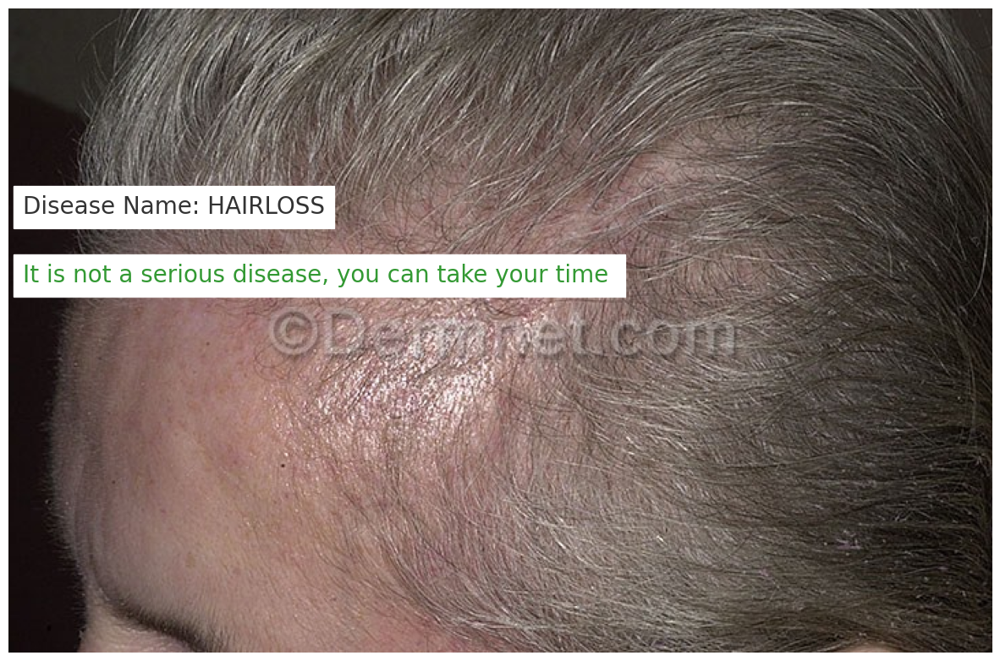

In [67]:
predict_image('C:/Users/samro/OneDrive/Bureau/archive/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg')

This image most likely belongs to '''Vasculties''' with a 86.18 percent confidence.
vasculties


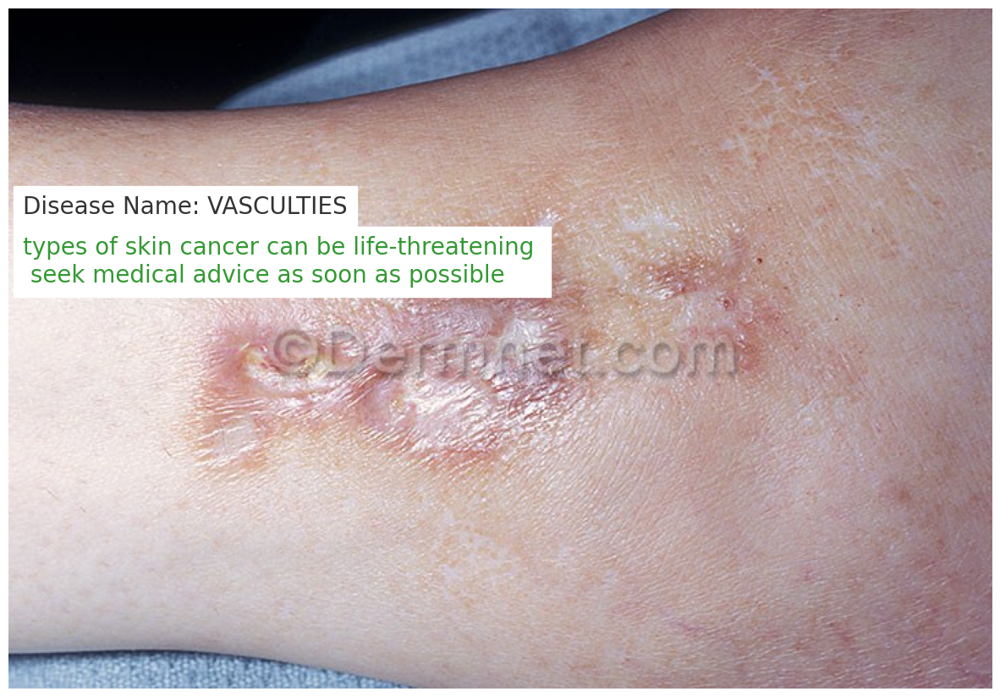

In [68]:
predict_image('C:/Users/samro/OneDrive/Bureau/archive/test/Vasculitis Photos/atrophy-blanche-4.jpg')

This image most likely belongs to '''Melanoma Skin Cancer Nevi and Moles''' with a 90.46 percent confidence.
melanoma skin cancer nevi and moles


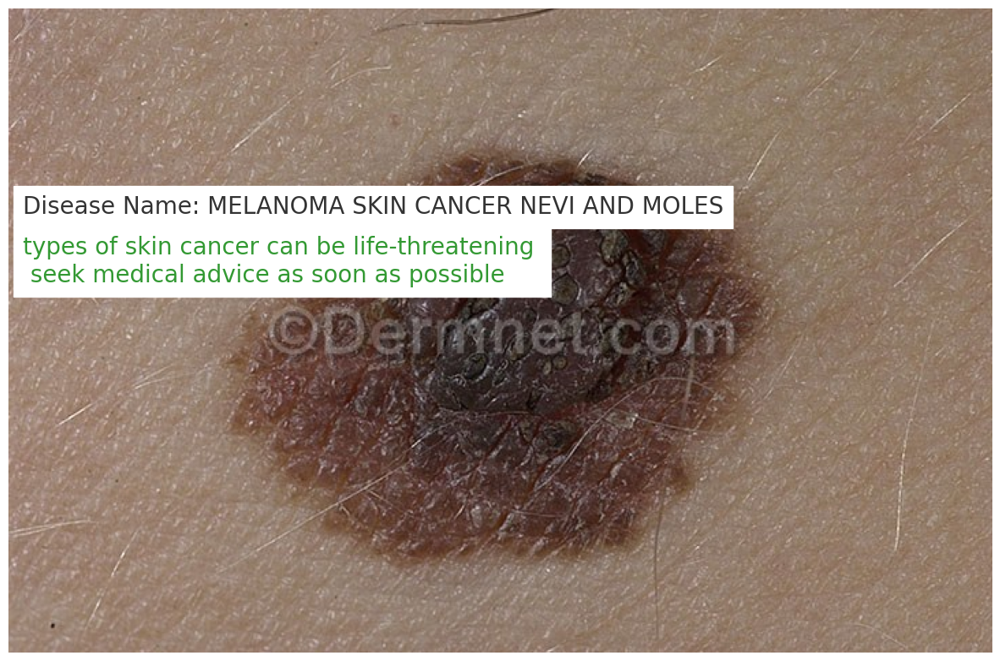

In [70]:
predict_image('C:/Users/samro/OneDrive/Bureau/archive/test/Melanoma Skin Cancer Nevi and Moles/atypical-nevi-23.jpg')

This image most likely belongs to '''Actinic Keratosis Basal Cell Carcinoma''' with a 89.80 percent confidence.
actinic keratosis basal cell carcinoma


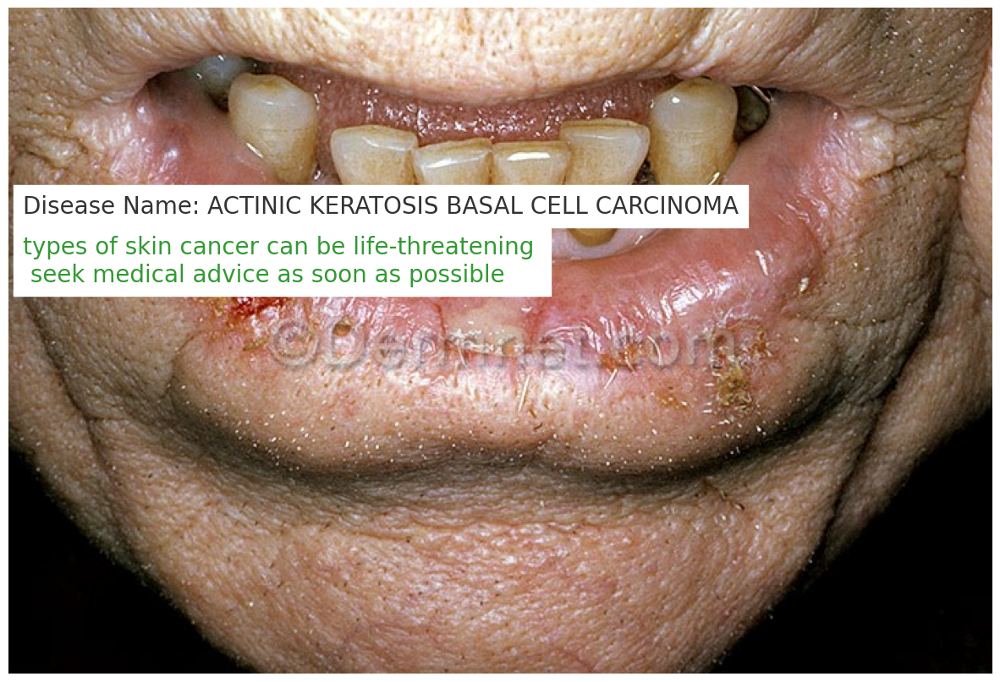

In [71]:
predict_image('C:/Users/samro/OneDrive/Bureau/archive/test/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions/actinic-cheilitis-sq-cell-lip-9.jpg')

This image most likely belongs to '''Vasculties''' with a 90.45 percent confidence.
vasculties


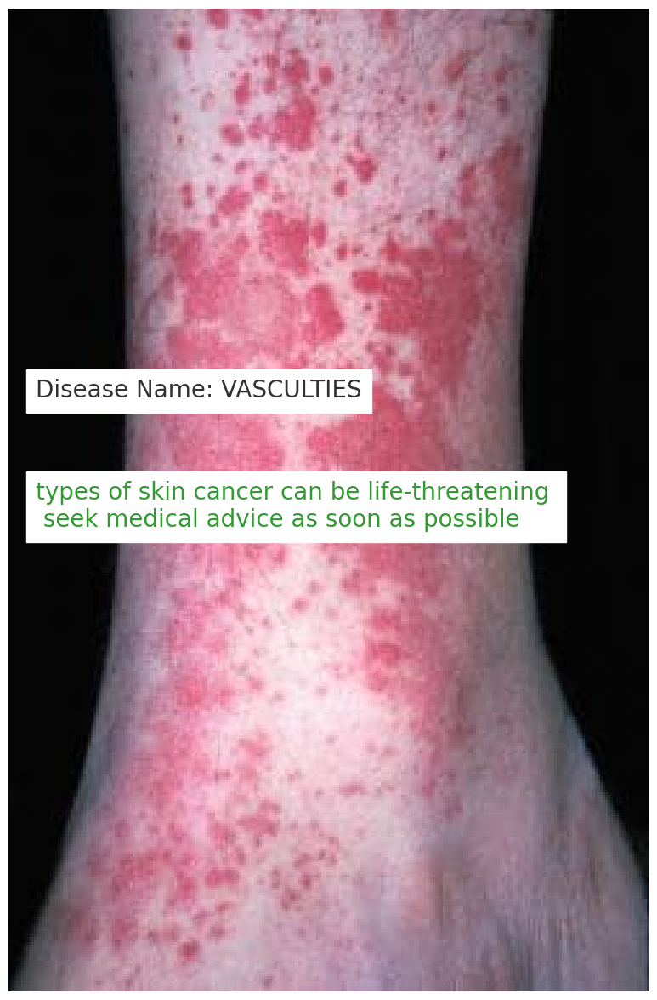

In [72]:
predict_image('C:/Users/samro/Downloads/28385tn.jpg')

# Mobile APP Part


In [77]:

import tensorflow as tf

# Load the saved Keras model
model = tf.keras.models.load_model('models/New.h5')

# Convert the model to a TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TensorFlow Lite model
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\samro\AppData\Local\Temp\tmp_bjxxcvr\assets


INFO:tensorflow:Assets written to: C:\Users\samro\AppData\Local\Temp\tmp_bjxxcvr\assets


SyntaxError: invalid syntax (3699943638.py, line 13)